# RNA velocity

In [74]:
import anndata
import scvelo as scv
import pandas as pd
import numpy as np
import re
import os
import matplotlib.pyplot as plt
import scanpy

In [2]:
scv.set_figure_params(style="scvelo", dpi_save=300, transparent=False)
scv.settings.figdir = "../plots/velocity/"
scv.settings.plot_prefix = ""
scv.settings.file_format_figs = "png"
scv.settings.n_jobs = 4
scv.settings.presenter_view = True

plt.rcParams.update({"savefig.facecolor": (1, 1, 1, 1)})

## Load data

In [68]:
nb = scv.read("../data_generated/rna_velocity_all.h5ad")
nb

AnnData object with n_obs × n_vars = 80789 × 2000
    obs: 'library_size', 'n_features', 'percent_mito', 'sample', 'group', 'bcds_score', 'umap_1_unaligned', 'umap_2_unaligned', 'umap_1_monocle', 'umap_2_monocle', 'tsne_1_monocle', 'tsne_2_monocle', 'cluster_20', 'partition_20', 'cluster_50', 'partition_50', 'cluster_0.2', 'cluster_0.5', 'cluster_0.8', 'signature_adrenergic', 'signature_mesenchymal', 'signature_ncc_like', 'signature_noradrenergic', 'umap_1_seurat', 'umap_2_seurat', 'tsne_1_seurat', 'tsne_2_seurat', 'cell_type_blueprint_fine', 'cell_type_blueprint_broad', 'cell_type_dice_fine', 'cell_type_dice_broad', 'cell_type_dmap_fine', 'cell_type_dmap_broad', 'cell_type_hpca_fine', 'cell_type_hpca_broad', 'cell_type_monaco_fine', 'cell_type_monaco_broad', 'umap_1_subcluster', 'umap_2_subcluster', 'subcluster_20', 'subcluster_50', 'cellont_name', 'cellont_id', 'cellont_abbr', 'cellont_cluster', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_counts', 'velocity_s

In [78]:
nb_tumor = scv.read("../data_generated/rna_velocity_tumor.h5ad")
nb_tumor

AnnData object with n_obs × n_vars = 4925 × 2000
    obs: 'library_size', 'n_features', 'percent_mito', 'sample', 'group', 'bcds_score', 'umap_1_unaligned', 'umap_2_unaligned', 'umap_1_monocle', 'umap_2_monocle', 'tsne_1_monocle', 'tsne_2_monocle', 'cluster_20', 'partition_20', 'cluster_50', 'partition_50', 'cluster_0.2', 'cluster_0.5', 'cluster_0.8', 'signature_adrenergic', 'signature_mesenchymal', 'signature_ncc_like', 'signature_noradrenergic', 'umap_1_seurat', 'umap_2_seurat', 'tsne_1_seurat', 'tsne_2_seurat', 'cell_type_blueprint_fine', 'cell_type_blueprint_broad', 'cell_type_dice_fine', 'cell_type_dice_broad', 'cell_type_dmap_fine', 'cell_type_dmap_broad', 'cell_type_hpca_fine', 'cell_type_hpca_broad', 'cell_type_monaco_fine', 'cell_type_monaco_broad', 'umap_1_subcluster', 'umap_2_subcluster', 'subcluster_20', 'subcluster_50', 'cellont_name', 'cellont_id', 'cellont_abbr', 'cellont_cluster', 'tumor_subcluster', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size', 'n_c

## Velocity embeddings

computing velocity embedding
    finished (0:00:20) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ../plots/velocity/arrows_all.png


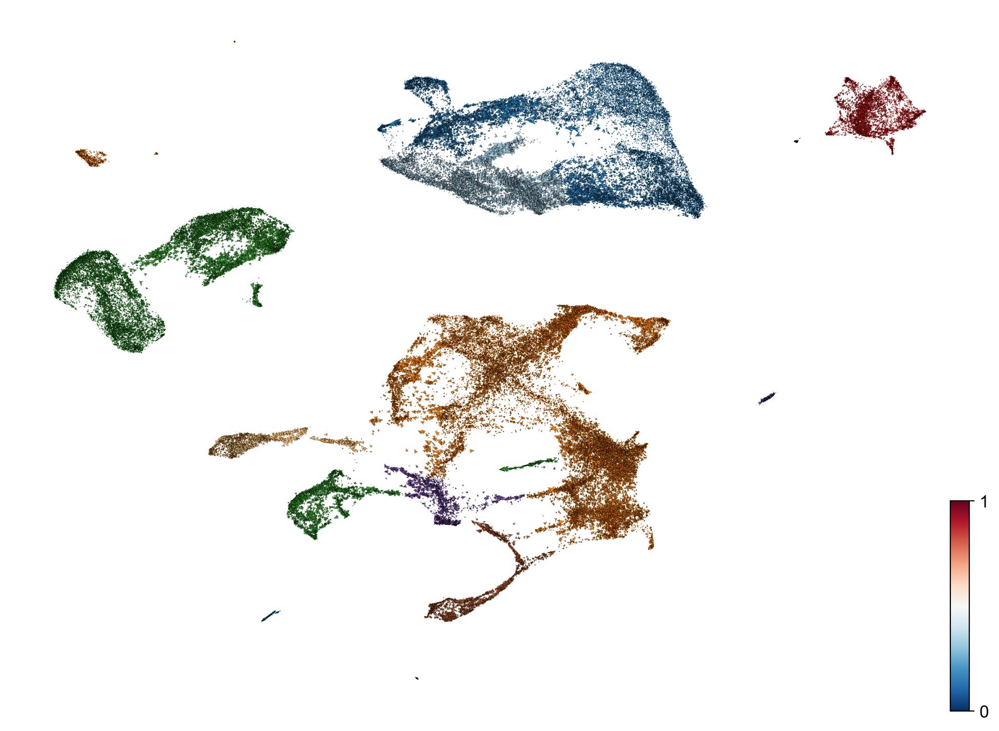

In [69]:
scv.pl.velocity_embedding(
    nb,
    color=nb.uns["cluster_colors"],
    arrow_length=3,
    arrow_size=2,
    save="arrows_all",
    figsize=[20, 15]
)

saving figure to file ../plots/velocity/stream_all.png


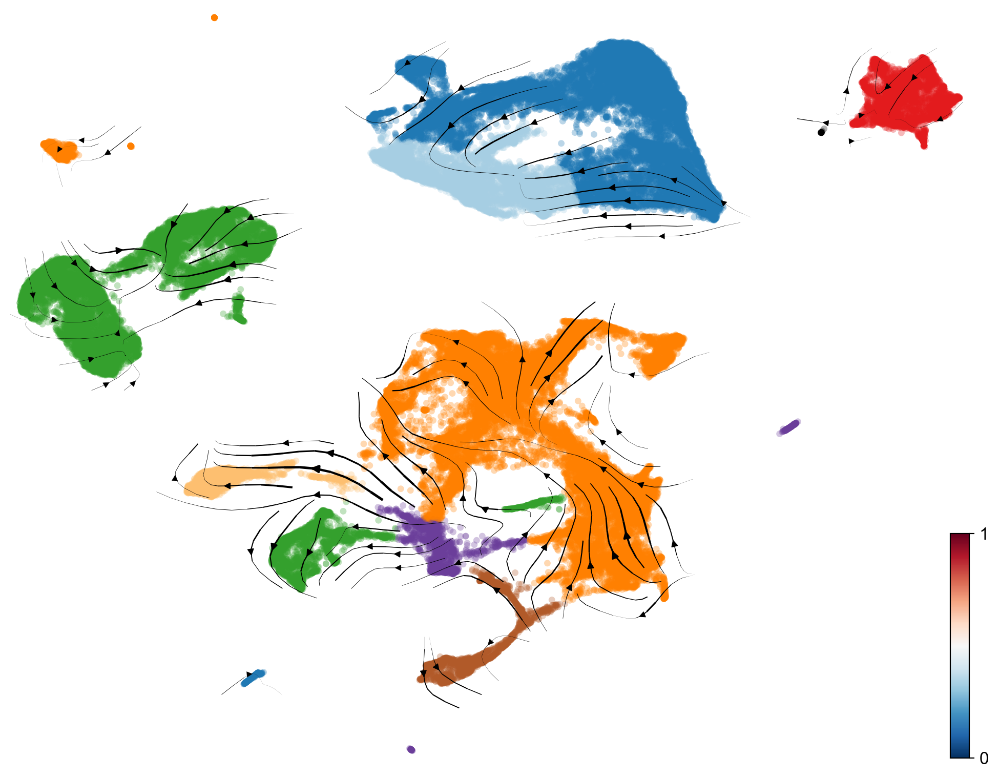

In [70]:
scv.pl.velocity_embedding_stream(
    nb,
    color=nb.uns["cluster_colors"],
    save="stream_all",
    figsize=[10, 8]
)

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)
saving figure to file ../plots/velocity/arrows_nb.png


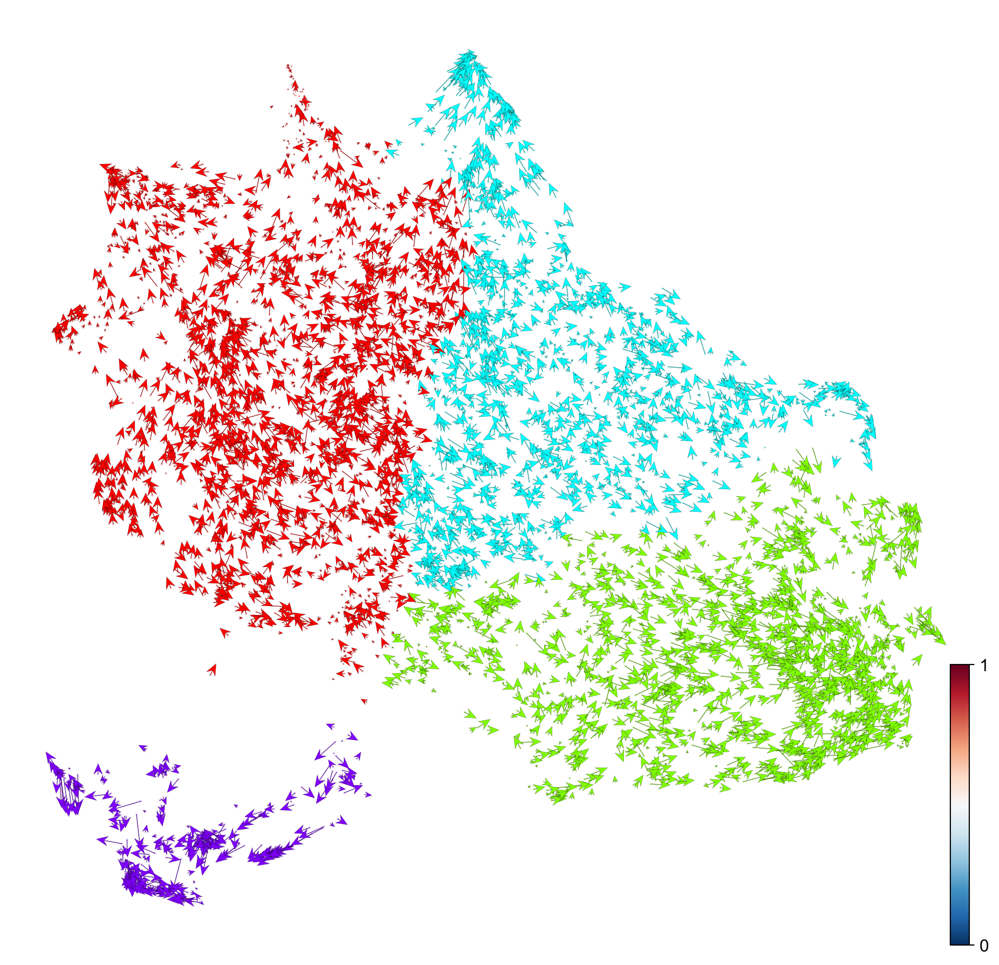

In [5]:
scv.pl.velocity_embedding(
    nb_tumor,
    color=nb_tumor.uns["cluster_colors"],
    arrow_length=8,
    arrow_size=2,
    save="arrows_nb",
    figsize=[15, 15]
)


In [76]:
#scv.tl.umap(nb_tumor)

saving figure to file ../plots/velocity/stream_nb_aligned.png


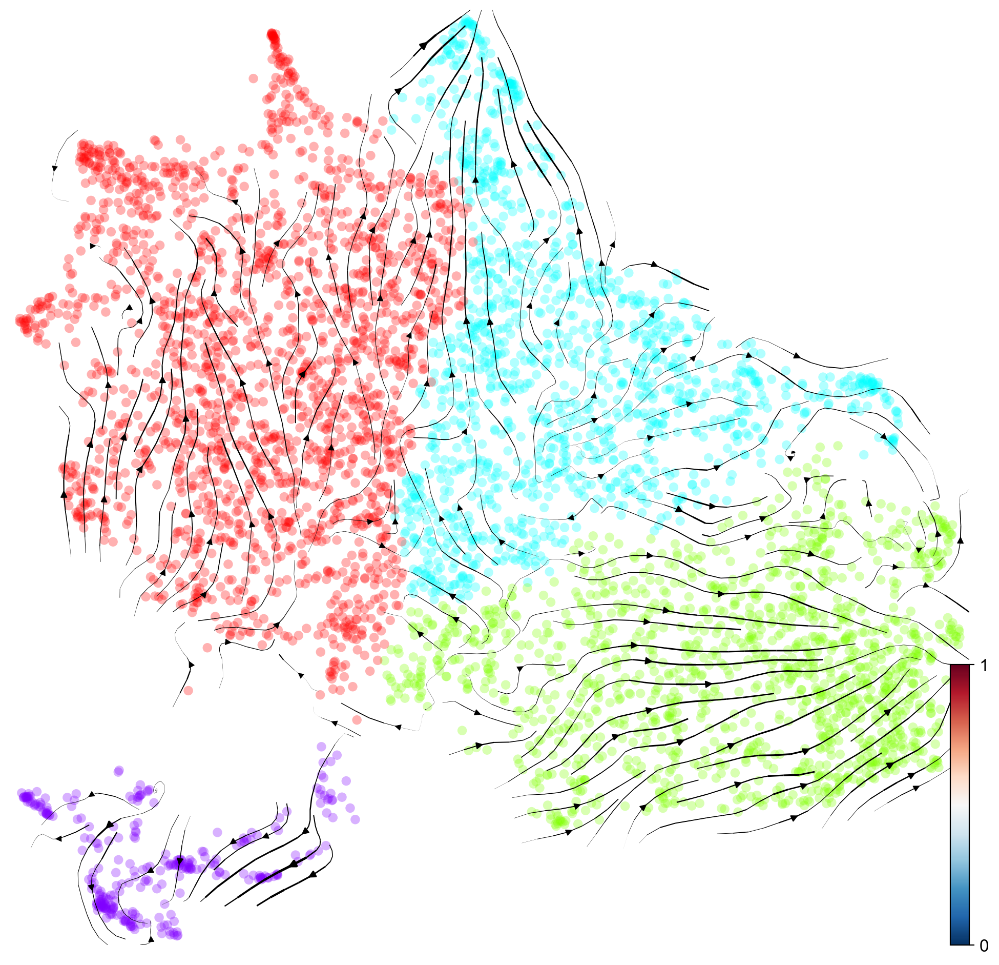

In [80]:
scv.pl.velocity_embedding_stream(
    nb_tumor,
    color=nb_tumor.uns["cluster_colors"],
    #color="sample",
    save="stream_nb_aligned",
    figsize=[15, 15]
)

## Important genes

In [7]:
scv.tl.rank_velocity_genes(
    nb_tumor,
    groupby="tumor_subcluster",
    min_corr=.3
)

ranking velocity genes
    finished (0:00:01) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)


In [8]:
df = scv.DataFrame(nb_tumor.uns["rank_velocity_genes"]["names"])
df.head(10)

,1,2,3,4
0,PCNA,DLGAP5,GINS2,RPL28
1,MTHFD1,SMC4,PCNA,CTTN
2,UBE2T,BIRC5,CNKSR3,DDX1
3,RAB3IP,KIF4A,EBF1,ERICH3
4,DDAH1,NUF2,E2F3,PYY
5,ACAT2,ZNF367,CCND1,TLL2
6,NPTX2,GTSE1,BX284668.5,ANXA2
7,CWC25,KIF11,PLEKHA6,NFKBIA
8,ODC1,KIFC1,GRID2,MUC15
9,SCD,CKAP2,RPS27L,EDIL3


saving figure to file ../plots/velocity/important_genes.png


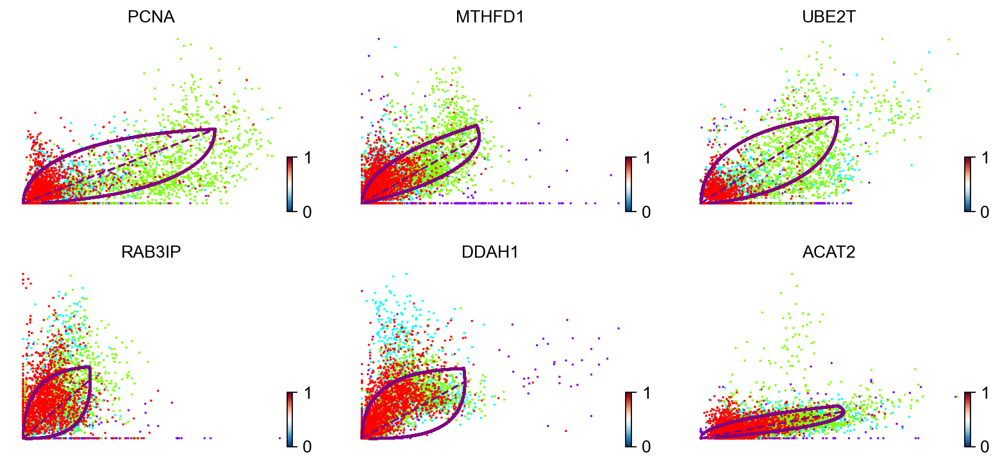

In [29]:
scv.pl.scatter(
    nb_tumor,
    df["1"][:6],
    frameon=False,
    size=10,
    linewidth=1.5,
    color=nb_tumor.uns["cluster_colors"],
    nrows=2,
    save="important_genes",
    figsize=[15, 10]
)

## Cell cycle

In [14]:
scv.tl.score_genes_cell_cycle(nb_tumor)

calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)


saving figure to file ../plots/velocity/cell_cycle.png


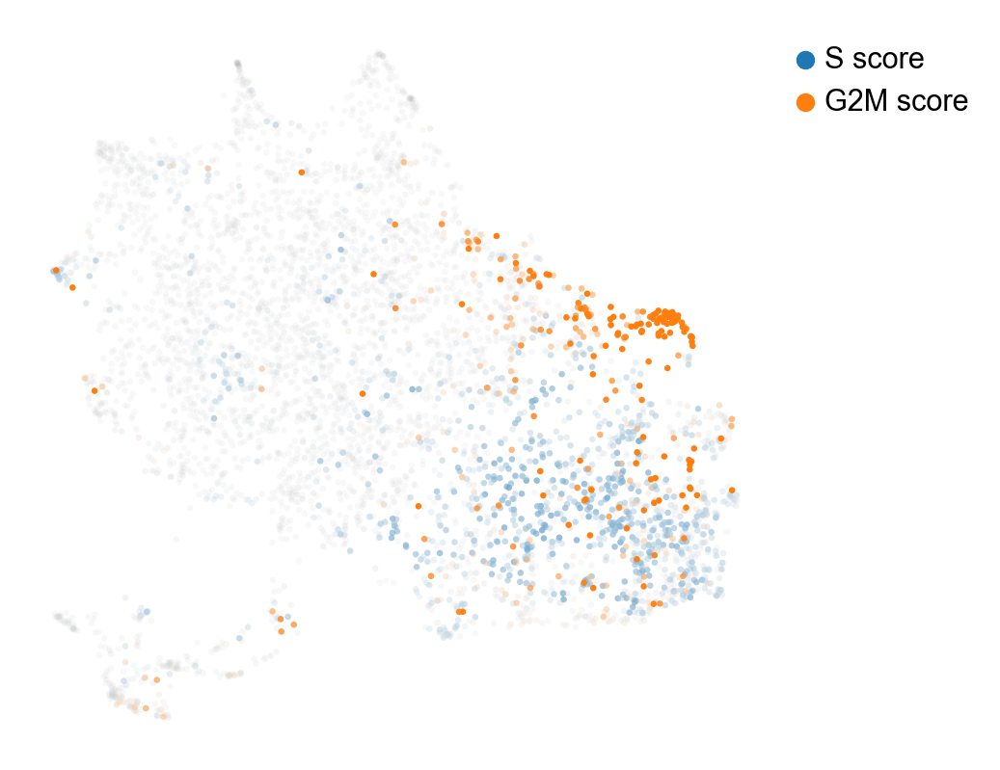

In [31]:
scv.pl.scatter(
    nb_tumor,
    color_gradients=["S_score", "G2M_score"],
    smooth=True,
    perc=[5, 95],
    save="cell_cycle",
    figsize=[5, 5]
)

In [16]:
s_genes, g2m_genes = scv.utils.get_phase_marker_genes(nb_tumor)
s_genes = scv.get_df(nb_tumor[:, s_genes], "spearmans_score", sort_values=True).index
g2m_genes = scv.get_df(nb_tumor[:, g2m_genes], "spearmans_score", sort_values=True).index

saving figure to file ../plots/velocity/cell_cycle_genes.png


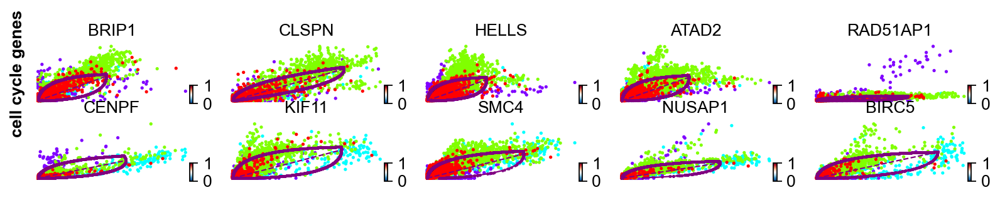

In [33]:
scv.pl.scatter(
    nb_tumor,
    list(s_genes[:5]) + list(g2m_genes[:5]),
    color=nb_tumor.uns["cluster_colors"],
    frameon=False,
    nrows=2,
    ylabel="cell cycle genes",
    save="cell_cycle_genes",
    figsize=[40, 15]
)

saving figure to file ../plots/velocity/cell_cycle_genes2.png


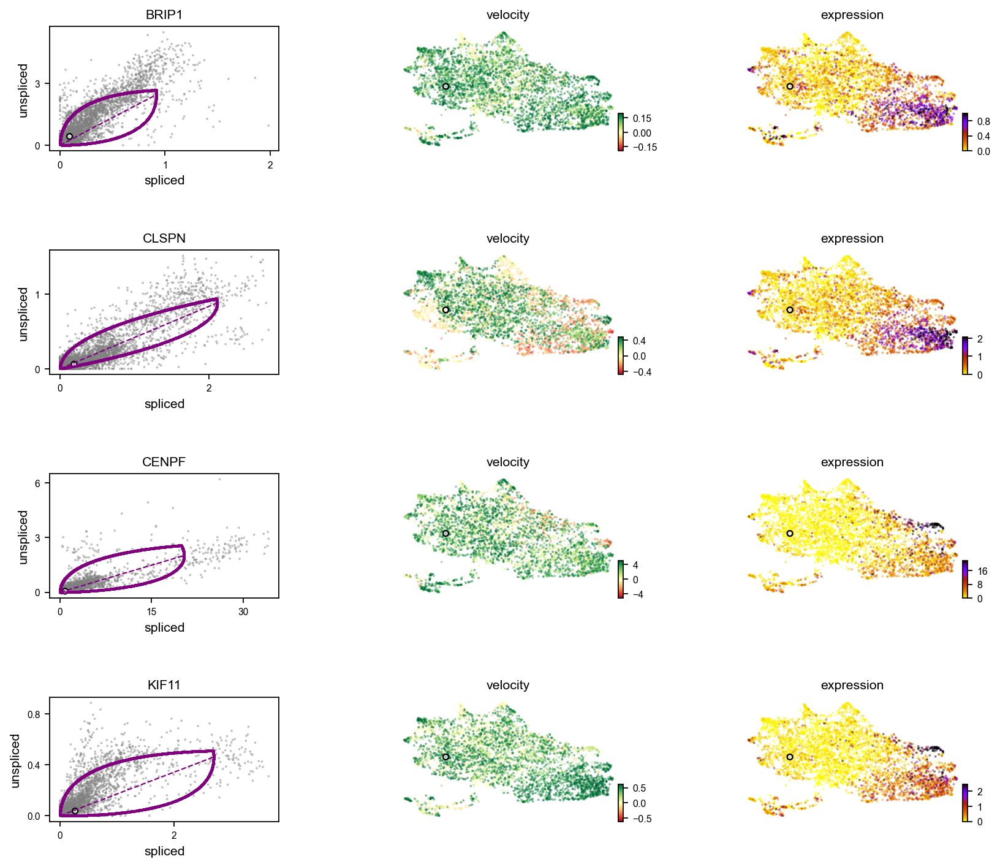

In [36]:
scv.pl.velocity(
    nb_tumor,
    ["BRIP1", "CLSPN", "CENPF", "KIF11"],
    add_outline=False,
    save="cell_cycle_genes2",
    figsize=[30, 20]
)

## Speed and coherence

In [21]:
scv.tl.velocity_confidence(nb_tumor)

--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)


saving figure to file ../plots/velocity/speed_coherence.png


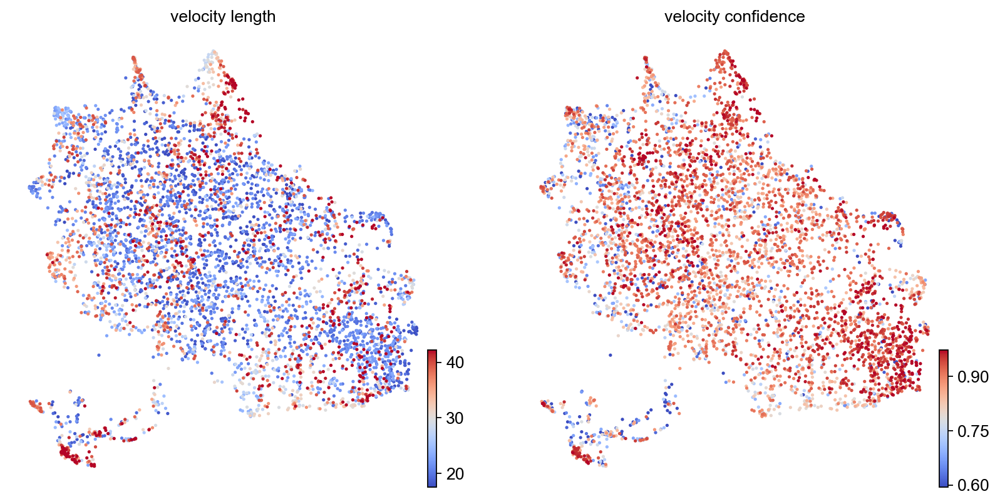

In [38]:
scv.pl.scatter(
    nb_tumor,
    c=["velocity_length", "velocity_confidence"],
    cmap="coolwarm",
    perc=[5, 95],
    save="speed_coherence",
    figsize=[10, 10]
)

In [25]:
(nb_tumor.obs.groupby("tumor_subcluster")
 [["velocity_length", "velocity_confidence"]]
 .mean()
 .T
 .style.background_gradient(cmap="coolwarm", axis=1))

tumor_subcluster,1,2,3,4
velocity_length,26.659744,27.026060,26.253657,32.406520
velocity_confidence,0.832629,0.874042,0.862590,0.747980


## Velocity graph

saving figure to file ../plots/velocity/velocity_graph.png


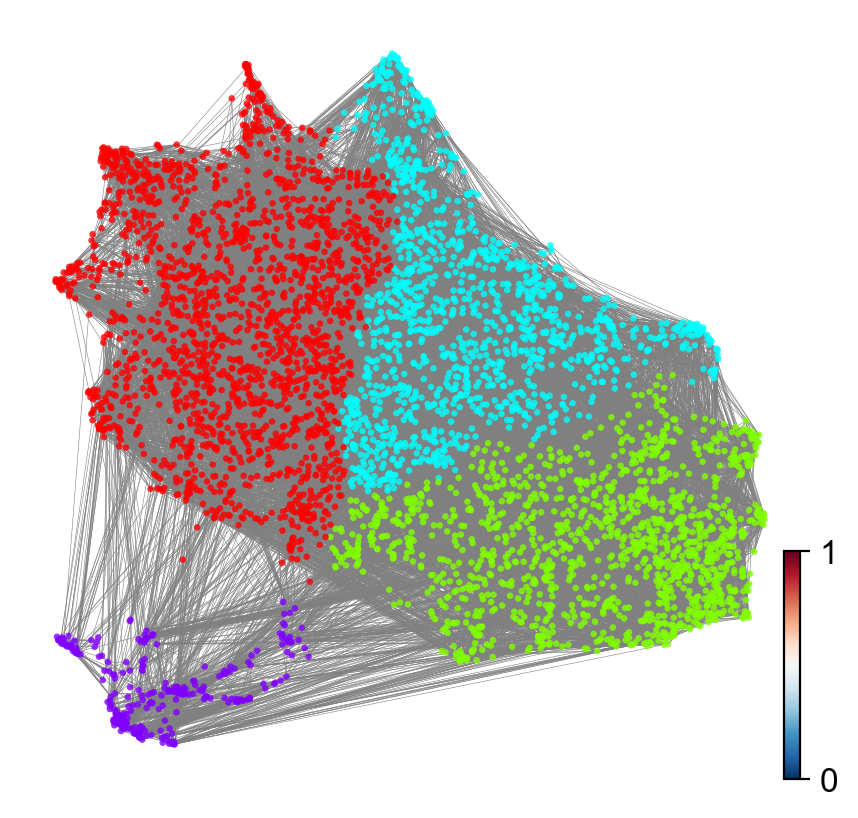

In [44]:
scv.pl.velocity_graph(
    nb_tumor,
    color=nb_tumor.uns["cluster_colors"],
    threshold=.1,
    save="velocity_graph",
    figsize=[5, 5]
)

## Pseudotime

In [40]:
scv.tl.velocity_pseudotime(nb_tumor)

computing terminal states
    identified 0 region of root cells and 3 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


saving figure to file ../plots/velocity/time_pseudo.png


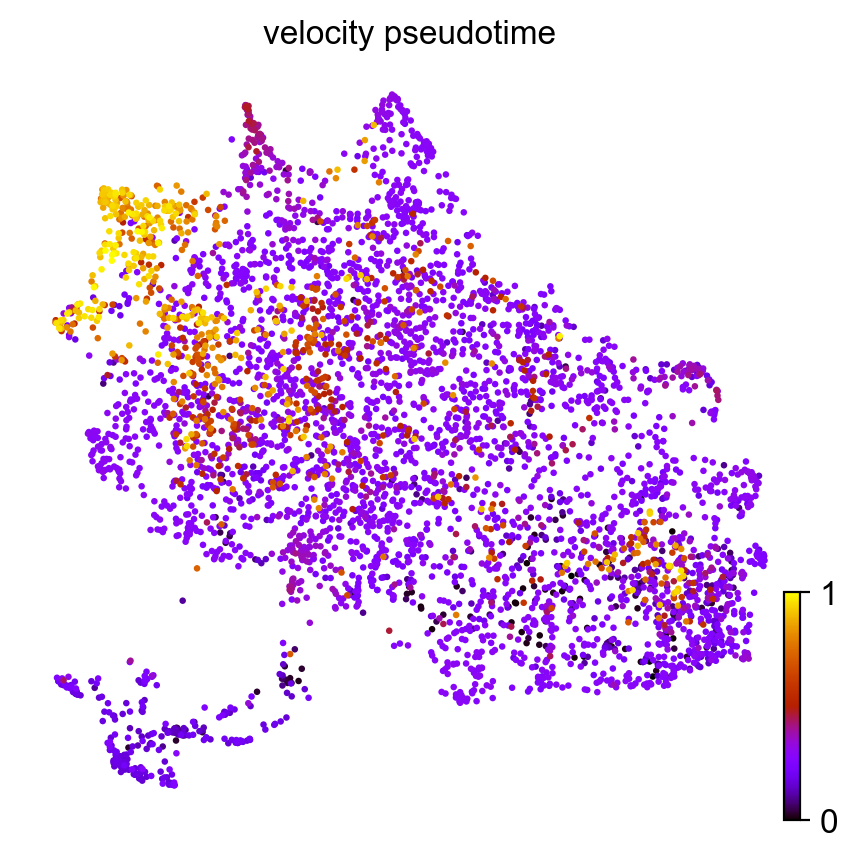

In [45]:
scv.pl.scatter(
    nb_tumor,
    color="velocity_pseudotime",
    cmap="gnuplot",
    save="time_pseudo",
    figsize=[5, 5]
)

In [43]:
scv.tl.latent_time(nb_tumor)

computing latent time using root_cells as prior
    finished (0:00:00) --> added 
    'latent_time', shared time (adata.obs)


saving figure to file ../plots/velocity/time_latent.png


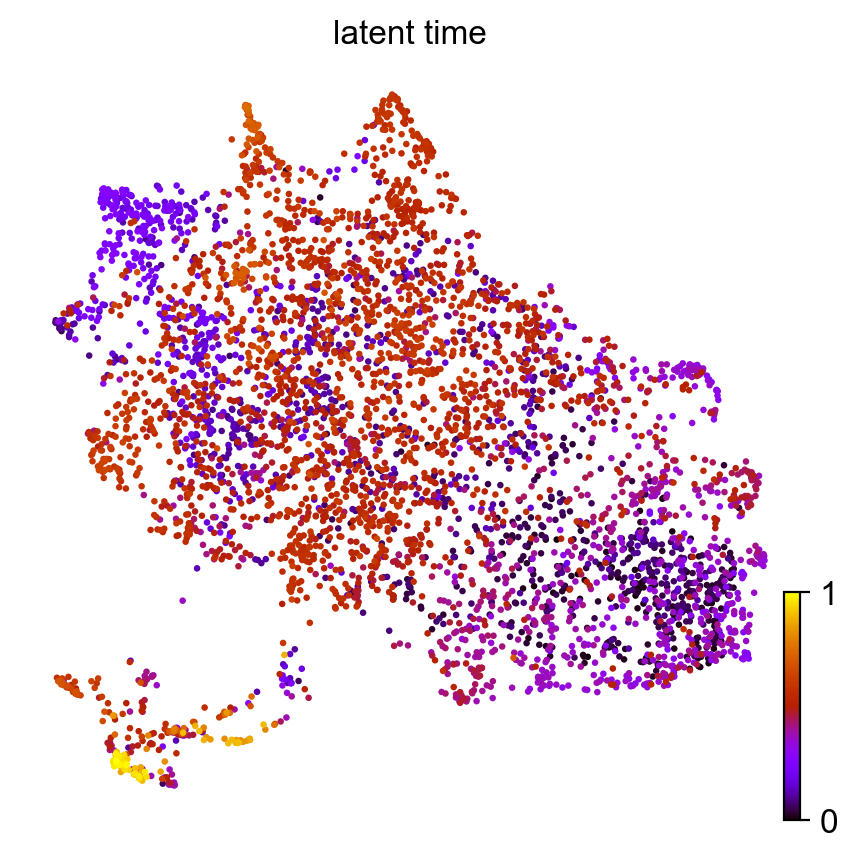

In [46]:
scv.pl.scatter(
    nb_tumor,
    color="latent_time",
    color_map="gnuplot",
    save="time_latent",
    figsize=[5, 5]
)

saving figure to file ../plots/velocity/heatmap_time_latent_genes.png


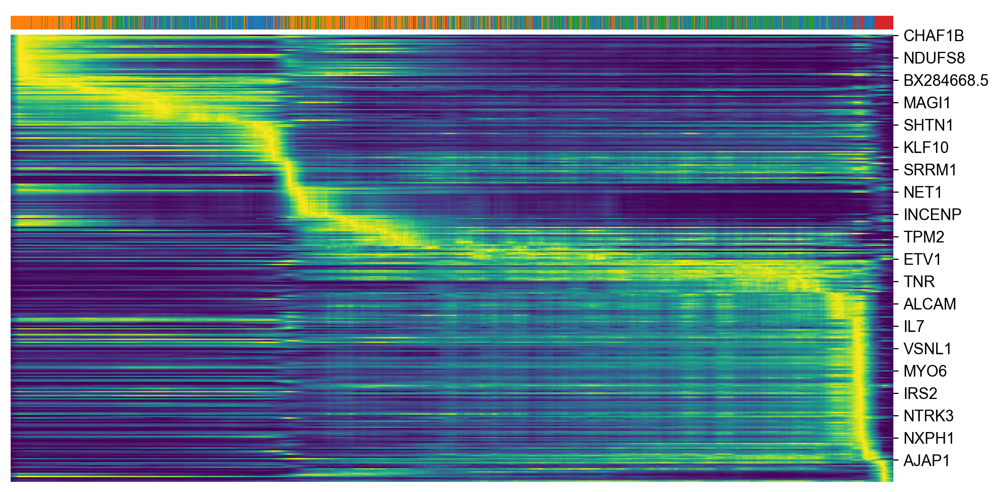

In [57]:
top_genes = nb_tumor.var["fit_likelihood"].sort_values(ascending=False).index
scv.pl.heatmap(
    nb_tumor,
    var_names=top_genes[:300],
    sortby="latent_time",
    col_color="tumor_subcluster",
    n_convolve=100,
    save="time_latent_genes",
    figsize=[10, 5]
)

## Top-likelihood genes

saving figure to file ../plots/velocity/top_likelihood_genes.png


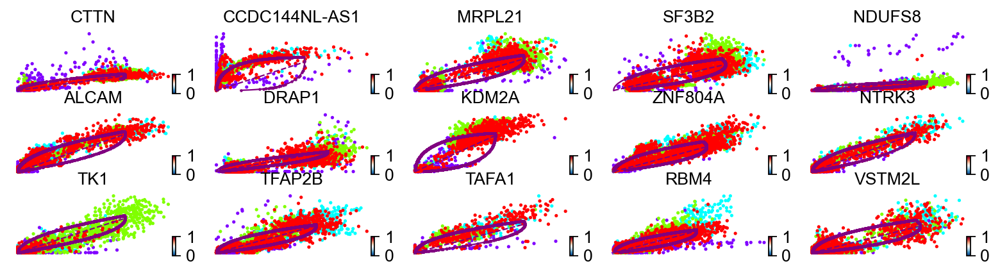

In [67]:
scv.pl.scatter(
    nb_tumor,
    top_genes[:15],
    color=nb_tumor.uns["cluster_colors"],
    ncols=5,
    frameon=False,
    save="top_likelihood_genes",
    figsize=[20, 8]
)

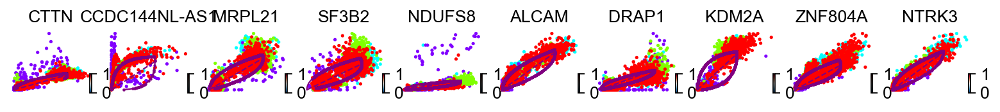

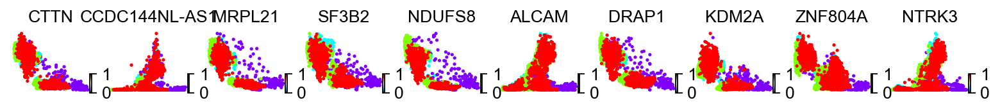

In [61]:
scv.pl.scatter(
    nb_tumor,
    top_genes[:10],
    color=nb_tumor.uns["cluster_colors"],
    frameon=False
)
scv.pl.scatter(
    nb_tumor,
    x='latent_time',
    y=top_genes[:10],
    color=nb_tumor.uns["cluster_colors"],
    frameon=False
)

## Cluster-specific top-likelihood genes

In [62]:
scv.tl.rank_dynamical_genes(nb_tumor, groupby="tumor_subcluster")

ranking genes by cluster-specific likelihoods
    finished (0:00:01) --> added 
    'rank_dynamical_genes', sorted scores by group ids (adata.uns)


In [64]:
df = scv.get_df(nb_tumor, "rank_dynamical_genes/names")
df.head(5)

,1,2,3,4
0,CTTN,CTTN,CTTN,ZNF804A
1,MRPL21,MRPL21,KDM2A,ALCAM
2,SF3B2,ZNF804A,SF3B2,ATP1B1
3,CCDC144NL-AS1,MRPL11,TBX3,ZFHX3
4,TFAP2B,KDM2A,ALCAM,KDM2A


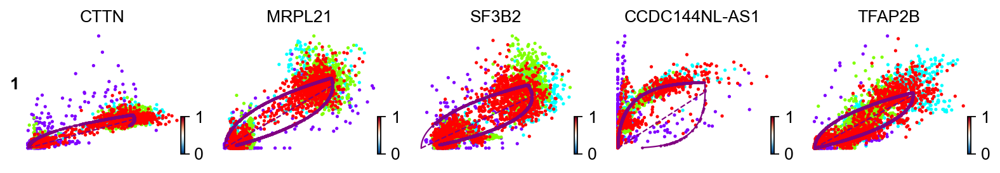

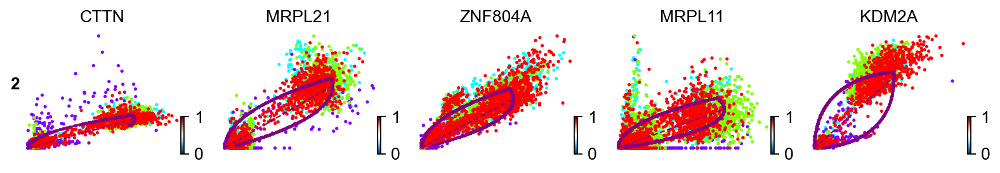

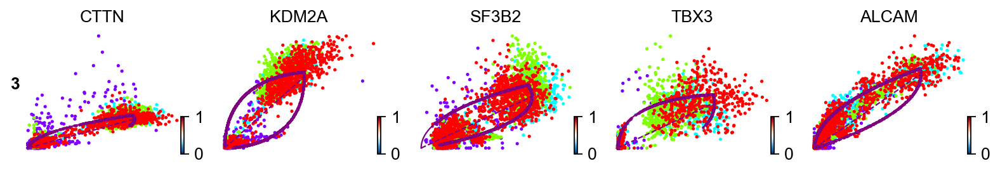

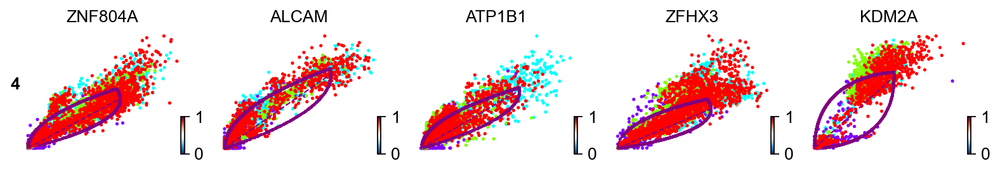

In [66]:
for cluster in ["1", "2", "3", "4"]:
    scv.pl.scatter(
        nb_tumor,
        df[cluster][:5],
        ylabel=cluster,
        color=nb_tumor.uns["cluster_colors"],
        frameon=False
    )